# Odd Result in Planck's Noise Simulations

There's something unexpected in Planck's noise simulations. It shows up most strongly for 545 and 857 GHz.

Contents:
- [100 GHz Simulations](#100-ghz-simulations)
- [545 GHz Simulations](#545-ghz-simulations)
- [857 GHz Simulations](#look-at-857-ghz)
- [353 GHz Simulations](#compare-to-353-ghz)
- [Similar effect in Half-mission difference maps](#half-mission-maps-contain-similar-phenomenon)

## Boilerplate

In [20]:
import logging
import sys
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
import pysm3.units as u

from cmbml.utils.handle_data import (
    get_planck_obs_data, 
    get_planck_noise_data, 
    get_planck_hm_data, 
    get_map_dtype
    )
from cmbml.utils.fits_inspection import get_field_unit

from system_config import ASSETS_DIRECTORY, NOISE_DIRECTORY

In [2]:
# Logging was helpful when debugging my handle_data module
logging.basicConfig(
    level=logging.WARNING,  # If DEBUG, there's a bunch of PySM3 and Matplotlib stuff
    format='%(levelname)s - %(message)s',
    handlers=[logging.StreamHandler(sys.stdout)]
)

# 100 GHz Simulations

For reference, here's what I've been seeing a lot working with Planck's noise simulations.

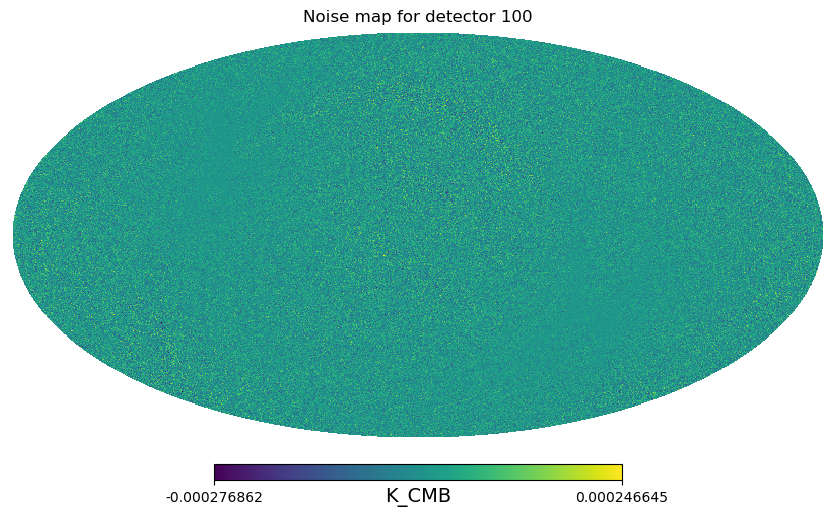

In [3]:
det100 = 100
nse_fn = get_planck_noise_data(detector=det100, assets_directory=NOISE_DIRECTORY, realization=0)
nse_unit = get_field_unit(nse_fn, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
nse_map = hp.read_map(nse_fn, field=0)
hp.mollview(nse_map, unit=nse_unit, title=f'Noise map for detector {det100}')

# 545 GHz Simulations

In [4]:
det545 = 545
# Get observations
obs_fn = get_planck_obs_data(detector=det545, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=det545, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=det545, assets_directory=NOISE_DIRECTORY, realization=1)
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
obs_unit, nse_unit

(Unit("MJy / sr"), Unit("MJy / sr"))

We plot the simulation noise with a scale such that the (expected) background noise is visible.

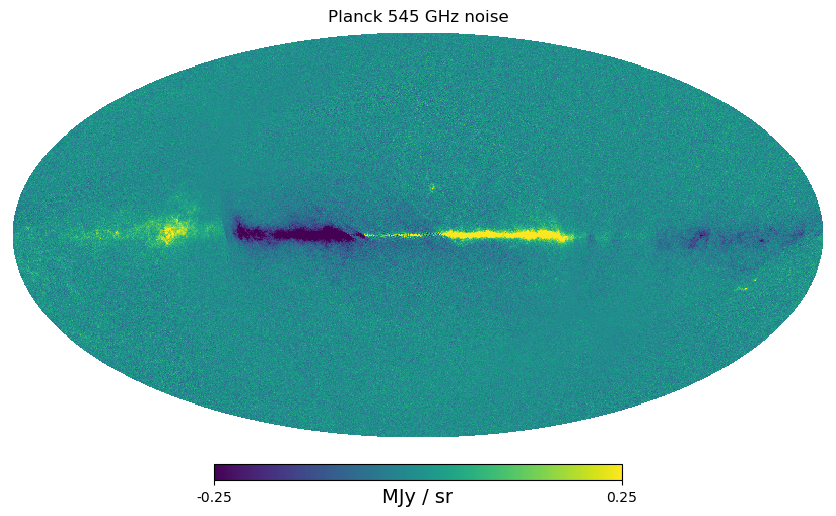

In [5]:
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)
hp.mollview(nse0, title=f'Planck {det545} GHz noise', **moll_plot_params|min_max)

A larger scale is needed to view the observations. Viewed this way I wonder if noise is even relevant for these detectors.

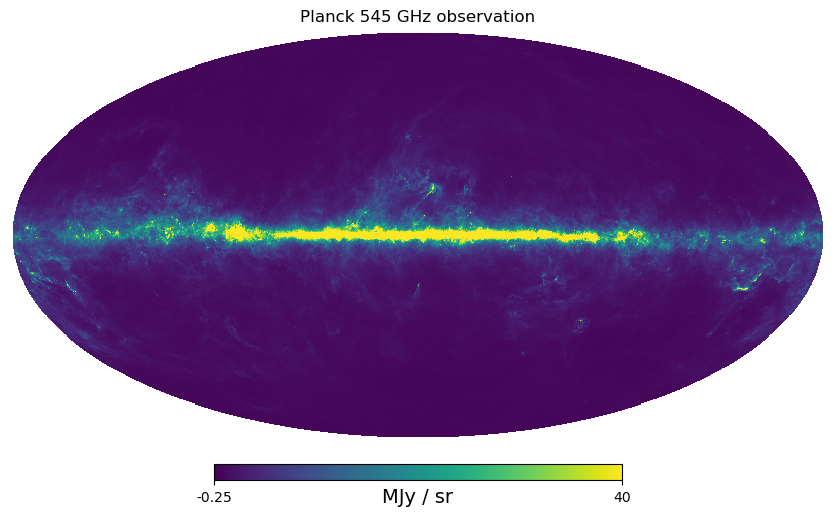

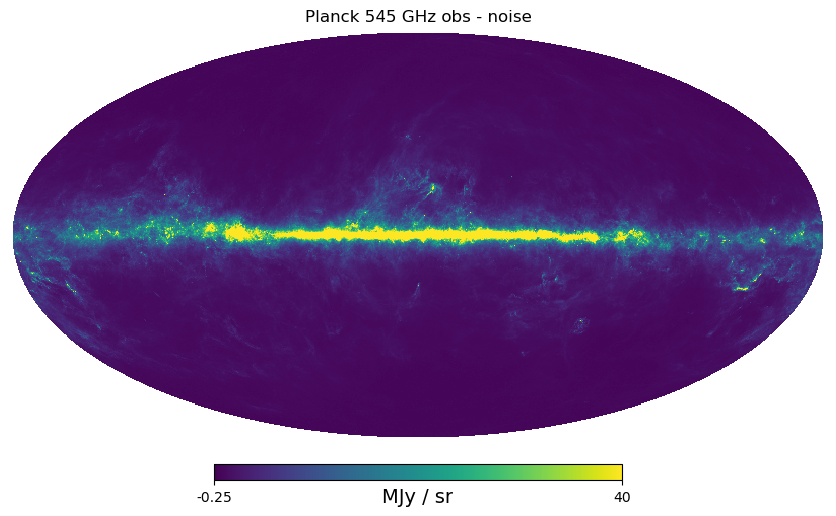

In [6]:
min_max2 = dict(min=-0.25, max=40)
hp.mollview(obs, title=f'Planck {det545} GHz observation', **moll_plot_params|min_max2)
hp.mollview(obs - nse0, title=f'Planck {det545} GHz obs - noise', **moll_plot_params|min_max2)

When we zoom in, it does reveal some minor difference (and if my eyes can see it, the math certainly will). Compare especially regions that appear flat.

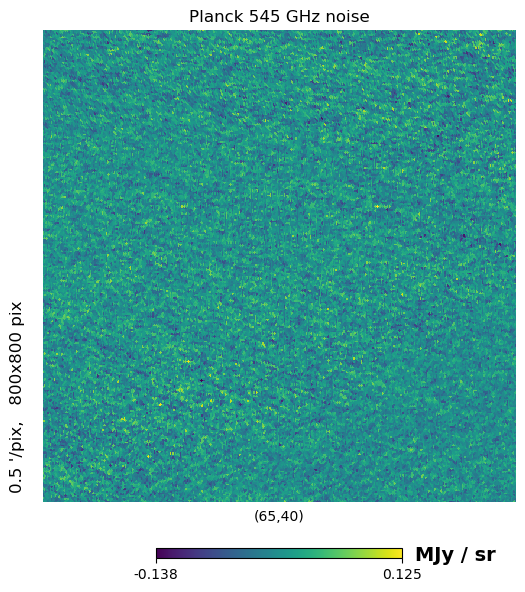

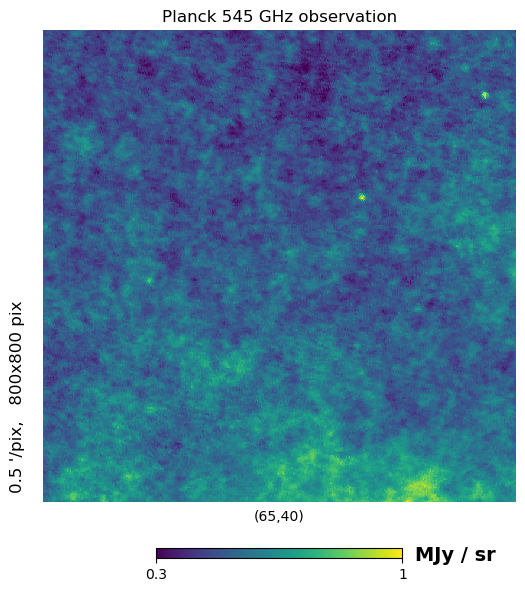

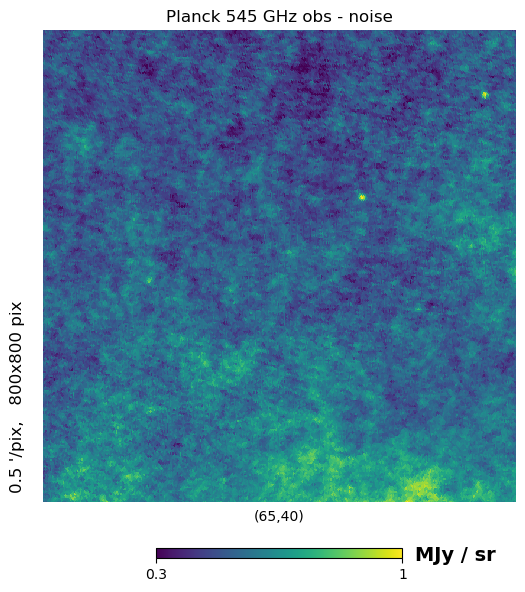

In [7]:
gnom_plot_params = dict(rot=[65, 40, 0], unit=obs_unit, reso=0.5, xsize=800)
min_max = dict(min=0.3, max=1)
hp.gnomview(nse0, title=f'Planck {DET} GHz noise', **gnom_plot_params)
hp.gnomview(obs, title=f'Planck {DET} GHz observation', **{**min_max,  **gnom_plot_params})
hp.gnomview(obs - nse0, title=f'Planck {DET} GHz obs - noise', **{**min_max, **gnom_plot_params})

# 857 GHz Simulation

We see less than was in 545, but still some stuff.

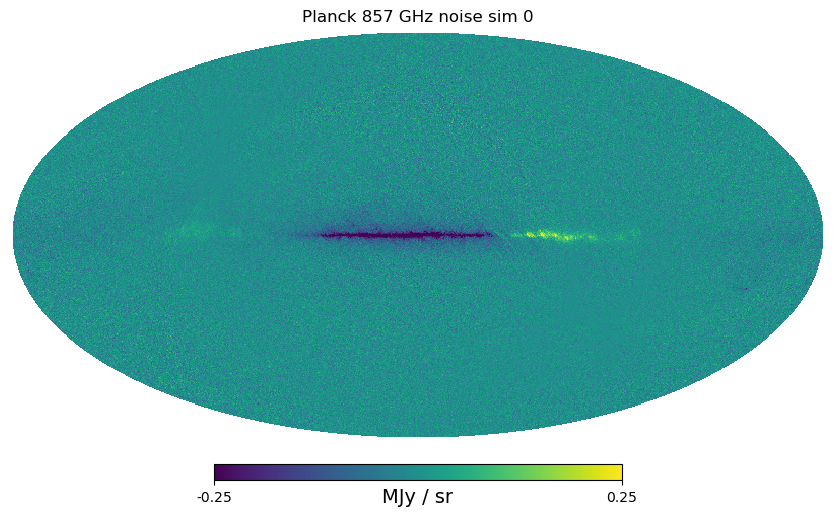

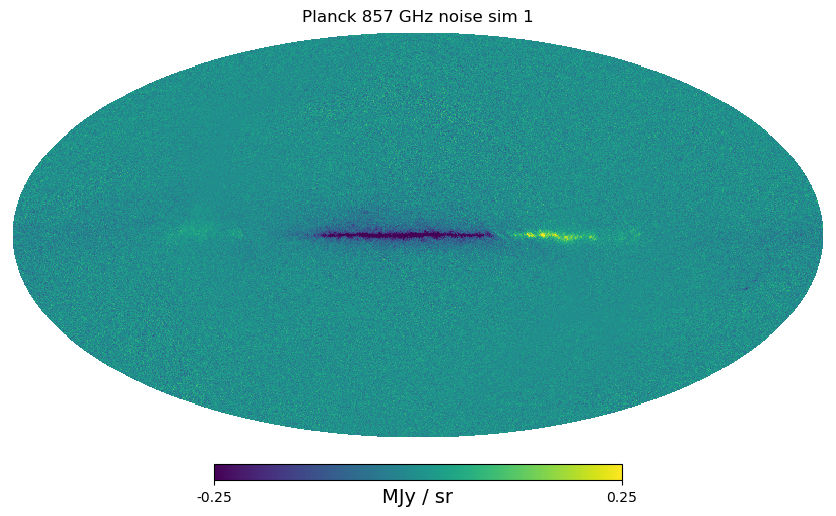

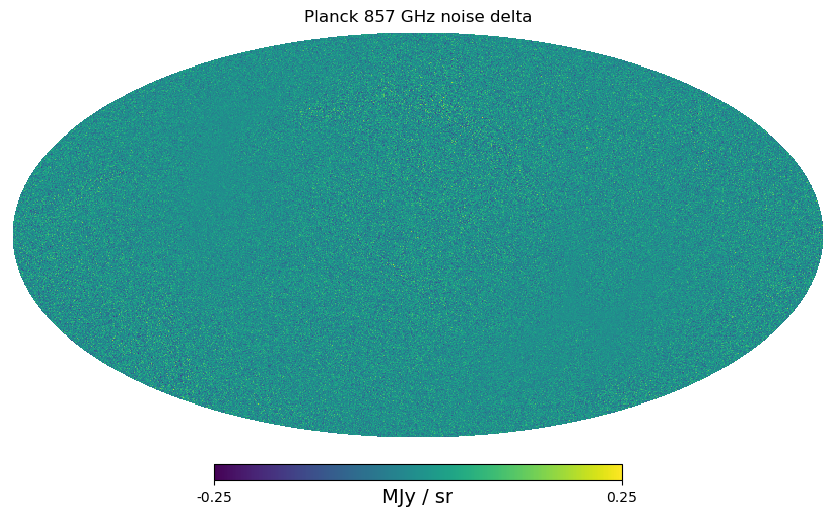

In [8]:
# Get observations
det857 = 857
# Get filenames
obs_fn = get_planck_obs_data(detector=det857, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=det857, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=det857, assets_directory=NOISE_DIRECTORY, realization=1)
# Load maps
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
# Get map units
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
# Setup and plot maps
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)
# min_max = dict(min=-0.1, max=0.1)
hp.mollview(nse0, title=f'Planck {det857} GHz noise sim 0', **moll_plot_params|min_max)
hp.mollview(nse1, title=f'Planck {det857} GHz noise sim 1', **moll_plot_params|min_max)
hp.mollview(nse1 - nse0, title=f'Planck {det857} GHz noise delta', **moll_plot_params|min_max)

# Compare to 353 GHz

At 353, we do see ***some*** galactic stuff, but apparently only sometimes (it surprised me when I did this). Maybe the fixed signal is a dampening around the galactic plane. We see it only when the mean noise across all the sky is similar to this galactic "signal".

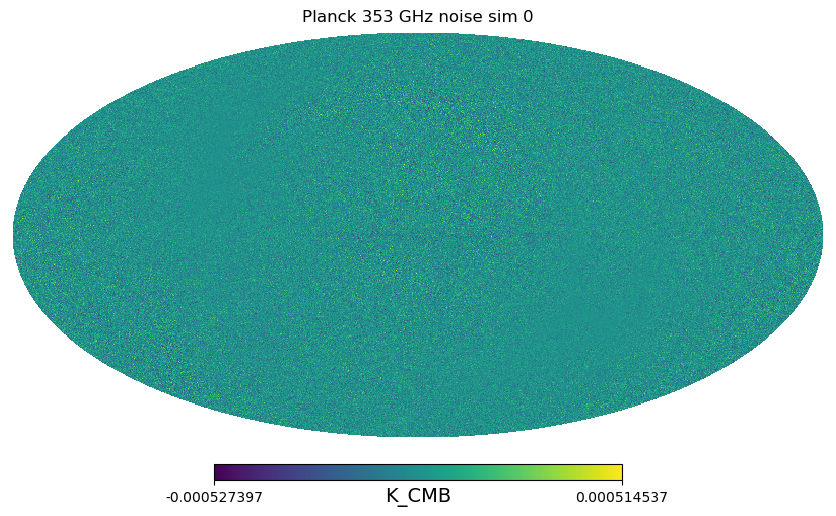

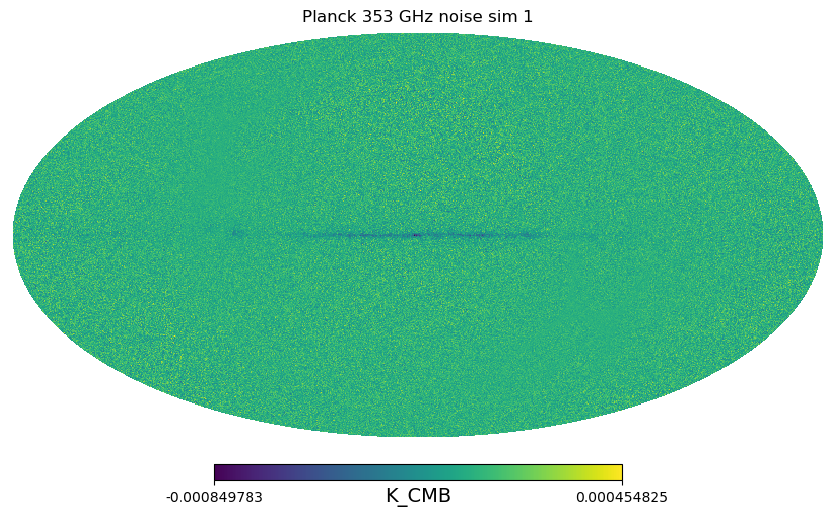

In [9]:
# Get observations
det353 = 353
# Get filenames
obs_fn = get_planck_obs_data(detector=det353, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=det353, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=det353, assets_directory=NOISE_DIRECTORY, realization=1)
# Load maps
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
# Get map units
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
# Setup and plot maps
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=None, max=None)
# min_max = dict(min=-0.1, max=0.1)
hp.mollview(nse0, title=f'Planck {det353} GHz noise sim 0', **moll_plot_params|min_max)
hp.mollview(nse1, title=f'Planck {det353} GHz noise sim 1', **moll_plot_params|min_max)
# hp.mollview(nse1 - nse0, title=f'Planck {DET} GHz noise delta', **moll_plot_params|min_max)

# Half-mission Maps contain similar phenomenon

There is something that shows up around these areas for the Half-mission maps. It's ... alternatively very large or small in these maps. I guess in the simulations they know it's uniform?

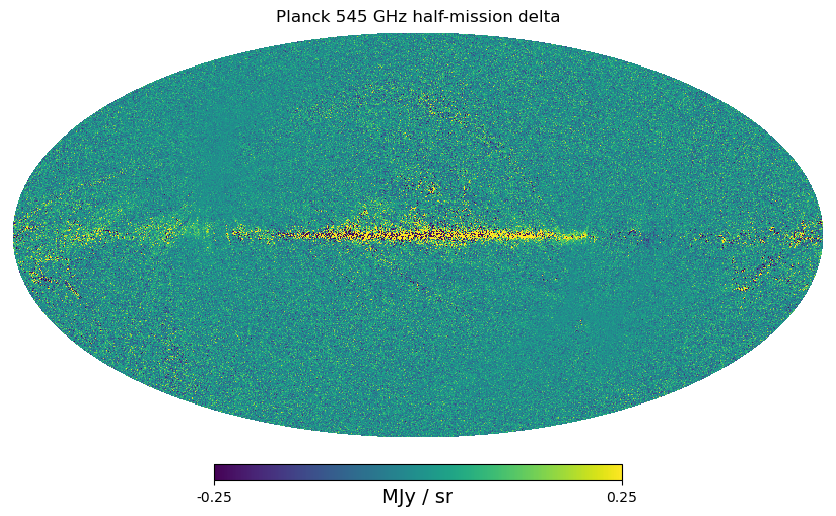

In [10]:
det545 = 545
hm545a_fn, hm545b_fn = get_planck_hm_data(det545, assets_directory=ASSETS_DIRECTORY, progress=True)
hm545a = hp.read_map(hm545a_fn)
hm545b = hp.read_map(hm545b_fn)

obs_unit = get_field_unit(hm545a_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
obs_unit, nse_unit

moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)

# hp.mollview(hm545a, title=f'Planck {det545} GHz half-mission 1', **moll_plot_params|min_max)
# hp.mollview(hm545b, title=f'Planck {det545} GHz half-mission 2', **moll_plot_params|min_max)
hp.mollview(hm545b - hm545a, title=f'Planck {det545} GHz half-mission delta', **moll_plot_params|min_max)

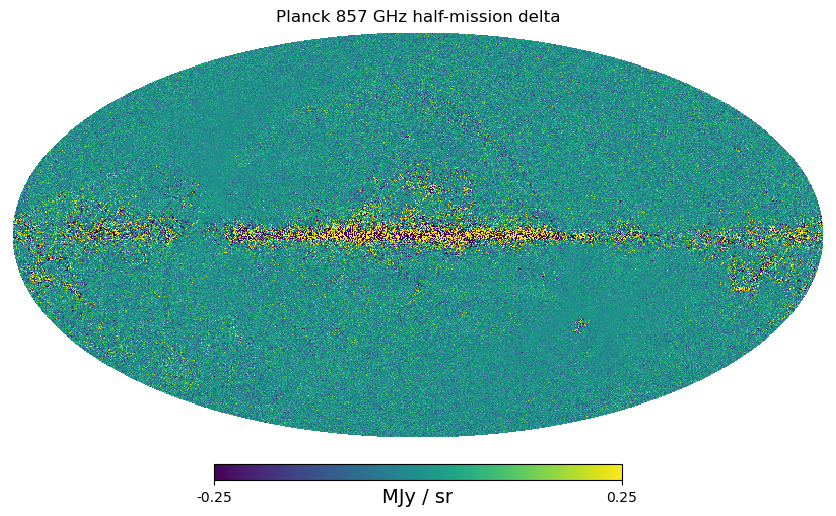

In [11]:
det857 = 857
hm857a_fn, hm857b_fn = get_planck_hm_data(det857, assets_directory=ASSETS_DIRECTORY, progress=True)
hm857a = hp.read_map(hm857a_fn)
hm857b = hp.read_map(hm857b_fn)

min_max = dict(min=-0.25, max=0.25)

# hp.mollview(hm857a, title=f'Planck {det857} GHz half-mission 1', **moll_plot_params|min_max)
# hp.mollview(hm857b, title=f'Planck {det857} GHz half-mission 2', **moll_plot_params|min_max)
hp.mollview(hm857b - hm857a, title=f'Planck {det857} GHz half-mission delta', **moll_plot_params|min_max)

# Why does this matter?

### 100 GHz Double-Simulated Map

In [66]:
CENTER_FREQS = {
    30: 28.4 * u.GHz,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    44: 44.1 * u.GHz,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    70: 70.4 * u.GHz,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    100: 100.89 * u.GHz,   # Value from Planck DeltaBandpassTable
    143: 142.876 * u.GHz,  # Value from Planck DeltaBandpassTable
    217: 221.156 * u.GHz,  # Value from Planck DeltaBandpassTable
    353: 357.5 * u.GHz,    # Value from Planck DeltaBandpassTable
    545: 555.2 * u.GHz,    # Value from Planck DeltaBandpassTable
    857: 866.8 * u.GHz,    # Value from Planck DeltaBandpassTable
}

In [67]:
def get_xxcov_field_num(detector, field_str):
    if detector not in [30, 44, 70, 100, 143, 217, 353, 545, 857]:
        raise ValueError(f"Detector {detector} not recognized")
    field_str = field_str.lower()
    lower_field_nums = dict(ii=4, iq=5, iu=6, qq=7, qu=8, uu=9)
    upper_field_nums = dict(ii=2)  # These detectors only have intensity data
    if detector in [545, 857]:
        if field_str not in upper_field_nums.keys():
            raise ValueError(f"Field {field_str} not available for detector {detector}")
        res = upper_field_nums[field_str]
    else:
        if field_str not in ['ii', 'iq', 'iu', 'qq', 'qu', 'uu']:
            raise ValueError(f"Field {field_str} not available for detector {detector}")
        res = lower_field_nums[field_str]
    return res

In [68]:
def _change_variance_map_resolution(m, nside_out):
    # For variance maps, because statistics
    power = 2

    # From PySM3 template.py's read_map function, with minimal alteration (added 'power'):
    m_dtype = get_map_dtype(m)
    nside_in = hp.get_nside(m)
    if nside_out < nside_in:  # do downgrading in double precision, per healpy instructions
        m = hp.ud_grade(m.astype(np.float64), power=power, nside_out=nside_out)
    elif nside_out > nside_in:
        m = hp.ud_grade(m, power=power, nside_out=nside_out)
    m = m.astype(m_dtype, copy=False)
    # End of used portion

    return m

In [69]:
def get_unit_from_str(unit_str):
    if unit_str in ['uK_CMB']:
        return u.uK_CMB
    elif unit_str in ['Kcmb', 'K_CMB']:
        return u.K_CMB
    elif unit_str in ['MJy/sr']:
        return u.MJy / u.sr
    else:
        raise ValueError(f"Unit {unit_str} not recognized")

def get_sqrt_unit_from_str(unit_str):
    if unit_str in ['Kcmb^2', '(K_CMB)^2', 'K_CMB^2']:
        return u.K_CMB
    elif unit_str in ['uK_CMB^2', '(uK_CMB)^2']:
        return u.uK_CMB
    elif unit_str in ['(MJy/sr)^2', '(Mjy/sr)^2', 'MJy/sr^2']:
        return u.MJy / u.sr
    else:
        raise ValueError(f"Unit {unit_str} not recognized")

In [70]:
def get_scale_map(det, nside_out):
    obs_fn = get_planck_obs_data(detector=det, assets_directory=ASSETS_DIRECTORY)
    use_field = get_xxcov_field_num(det100, 'II')
    II_cov_map = hp.read_map(obs_fn, hdu=1, field=use_field)
    II_cov_map_512 = _change_variance_map_resolution(II_cov_map, nside_out)
    scale_map = np.sqrt(II_cov_map_512)

    var_map_unit = get_field_unit(obs_fn, hdu=1, field_idx=use_field)
    var_map_unit = get_sqrt_unit_from_str(var_map_unit)
    scale_map = scale_map * var_map_unit
    scale_map = u.Quantity(scale_map, unit=var_map_unit)

    return scale_map

In [100]:
def make_sim_noise_params(det):
    data = np.load(f"noise_model_{det}GHz_n50_uK.npz")

    src_mean_ps     = data['mean_ps']
    src_components  = data['components']
    src_variance    = data['variance']

    src_mean_maps   = data['maps_mean']
    src_sd_maps     = data['maps_sd']
    # src_mean_maps   = data['mean_maps']
    # src_sd_maps     = data['sd_maps']
    src_map_unit    = data['map_unit']

    num_components = len(src_variance)

    std_devs = np.sqrt(src_variance)
    reduced_samples = np.random.normal(0, std_devs, (num_components,))

    # Reconstruct power spectra in log10 space
    tgt_log_ps = reduced_samples @ src_components + src_mean_ps

    # Convert out of log10 space
    tgt_cls = 10**tgt_log_ps

    src_map_unit = get_unit_from_str(src_map_unit)

    return tgt_cls, src_mean_maps, src_sd_maps, src_map_unit

In [101]:
det100 = 100
NSIDE_OUT = 512
SEED = 42
lmax = 3*NSIDE_OUT-1
scale_map = get_scale_map(det100, NSIDE_OUT)
rng = np.random.default_rng(SEED)
wht_nse_map = rng.normal(size=scale_map.size) * scale_map

In [102]:
tgt_cl, tgt_mean, tgt_sd, tgt_unit = make_sim_noise_params(det100)
print(f"tgt_unit is {tgt_unit}, scale_map.unit is {scale_map.unit}")

tgt_unit is uK_CMB, scale_map.unit is K_CMB


In [103]:
# Reverse sign of white noise map if needed
subs_mean     = np.random.normal(tgt_mean, tgt_sd) * tgt_unit
subs_sign     = np.sign(subs_mean)

wht_mean      = wht_nse_map.mean()
wht_sign      = np.sign(wht_mean)

if wht_sign != subs_sign:
    wht_nse_map = -wht_nse_map

In [109]:
if wht_nse_map.unit == u.K_CMB:
    wht_nse_map = wht_nse_map.to(u.uK_CMB)

In [112]:
# Filter map
assert tgt_unit == wht_nse_map.unit, f"tgt_unit is {tgt_unit}, wht_nse_map.unit is {wht_nse_map.unit}"

wht_nse_alms = hp.map2alm(wht_nse_map, lmax=lmax)
wht_nse_cl = hp.alm2cl(wht_nse_alms)

map_filter = np.sqrt(tgt_cl[:lmax+1] / wht_nse_cl)
filtered_alms = hp.almxfl(wht_nse_alms, map_filter)
filtered_map = hp.alm2map(filtered_alms, nside=NSIDE_OUT) * tgt_unit

In [113]:
# Adjust monopole if needed
min_mean_t = (tgt_mean - 3*tgt_sd) * tgt_unit
max_mean_t = (tgt_mean + 3*tgt_sd) * tgt_unit
subs_mean     = np.random.normal(tgt_mean, tgt_sd) * tgt_unit
subs_sign     = np.sign(subs_mean)

if filtered_map.mean() < min_mean_t or filtered_map.mean() > max_mean_t:
    _adjusted_map = filtered_map + subs_mean - filtered_map.mean()
    filtered_map = _adjusted_map

In [120]:
# Get noise map cl for comparison
nse_fn0 = get_planck_noise_data(detector=det100, assets_directory=NOISE_DIRECTORY, realization=0)
src_nse_map = hp.read_map(nse_fn0)
src_nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
src_nse_unit = get_unit_from_str(src_nse_unit)

src_nse_map = src_nse_map * src_nse_unit
if src_nse_map.unit == u.K_CMB:
    src_nse_map = src_nse_map.to(u.uK_CMB)
src_nse_cl = hp.anafast(src_nse_map, lmax=lmax)

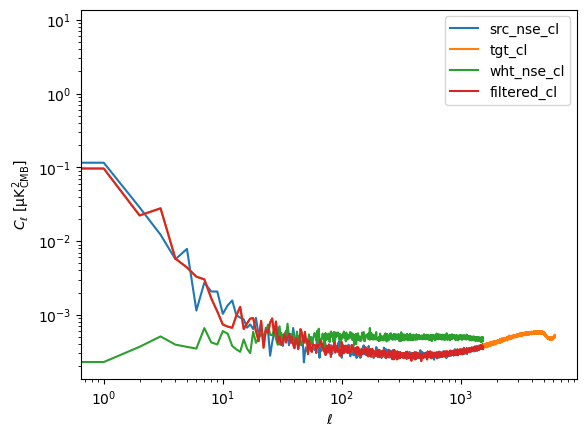

In [123]:
filtered_cl = hp.anafast(filtered_map)
plt.plot(src_nse_cl, label='src_nse_cl')
plt.plot(tgt_cl, label='tgt_cl')
plt.plot(wht_nse_cl, label='wht_nse_cl')
plt.plot(filtered_cl, label='filtered_cl')
plt.loglog()
plt.legend()
plt.xlabel('$\\ell$')
plt.ylabel('$C_\\ell$' + f' [{tgt_unit*tgt_unit:latex_inline}]')
plt.show()

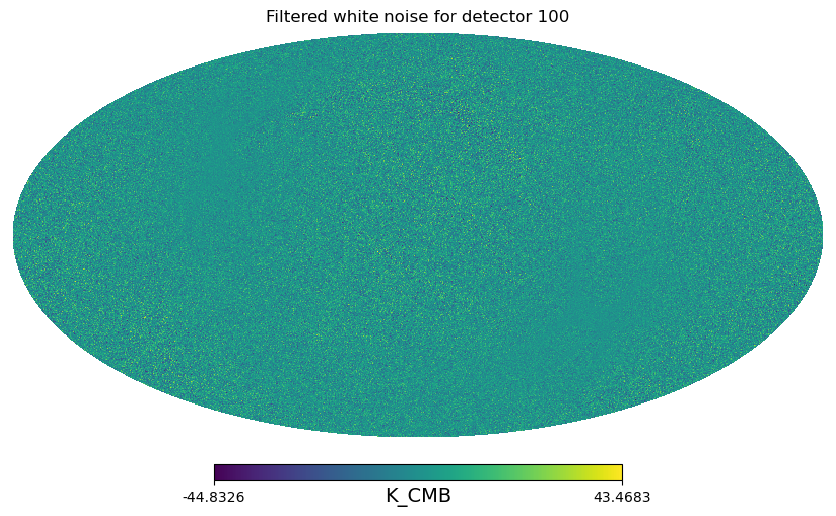

In [116]:
hp.mollview(filtered_map, unit=scale_map.unit, title=f'Filtered white noise for detector {det100}')

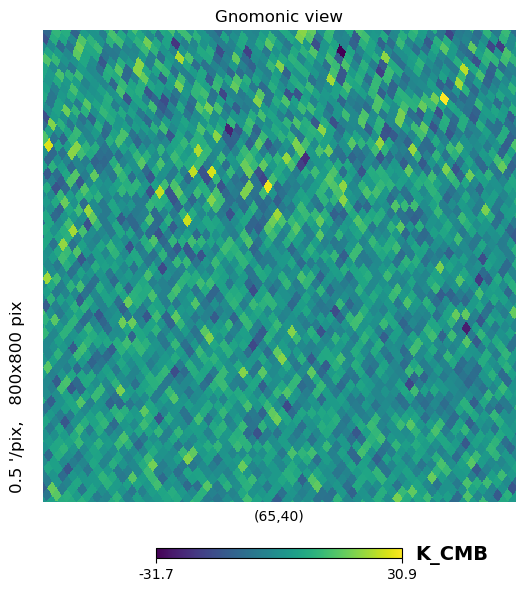

In [117]:
hp.gnomview(filtered_map, rot=[65, 40, 0], unit=scale_map.unit, reso=0.5, xsize=800)

# New Method as Single Function

In [125]:
NSIDE_OUT = 512
SEED = 42

def test_filter_noise_map(detector):
    lmax = 3*NSIDE_OUT-1
    scale_map = get_scale_map(detector, NSIDE_OUT)
    rng = np.random.default_rng(SEED)
    wht_nse_map = rng.normal(size=scale_map.size) * scale_map

    tgt_cl, tgt_mean, tgt_sd, tgt_unit = make_sim_noise_params(detector)
    print(f"tgt_unit is {tgt_unit}, scale_map.unit is {scale_map.unit}")

    # Reverse sign of white noise map if needed
    subs_mean     = np.random.normal(tgt_mean, tgt_sd) * tgt_unit
    subs_sign     = np.sign(subs_mean)

    wht_mean      = wht_nse_map.mean()
    wht_sign      = np.sign(wht_mean)

    if wht_sign != subs_sign:
        wht_nse_map = -wht_nse_map

    if wht_nse_map.unit == u.K_CMB:
        wht_nse_map = wht_nse_map.to(u.uK_CMB)

    # Filter map
    assert tgt_unit == wht_nse_map.unit, f"tgt_unit is {tgt_unit}, wht_nse_map.unit is {wht_nse_map.unit}"

    wht_nse_alms = hp.map2alm(wht_nse_map, lmax=lmax)
    wht_nse_cl = hp.alm2cl(wht_nse_alms)

    map_filter = np.sqrt(tgt_cl[:lmax+1] / wht_nse_cl)
    filtered_alms = hp.almxfl(wht_nse_alms, map_filter)
    filtered_map = hp.alm2map(filtered_alms, nside=NSIDE_OUT) * tgt_unit

    # Adjust monopole if needed
    min_mean_t = (tgt_mean - 3*tgt_sd) * tgt_unit
    max_mean_t = (tgt_mean + 3*tgt_sd) * tgt_unit
    subs_mean     = np.random.normal(tgt_mean, tgt_sd) * tgt_unit
    subs_sign     = np.sign(subs_mean)

    if filtered_map.mean() < min_mean_t or filtered_map.mean() > max_mean_t:
        _adjusted_map = filtered_map + subs_mean - filtered_map.mean()
        filtered_map = _adjusted_map

    # Get noise map cl for comparison
    nse_fn0 = get_planck_noise_data(detector=detector, assets_directory=NOISE_DIRECTORY, realization=0)
    src_nse_map = hp.read_map(nse_fn0)
    src_nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
    src_nse_unit = get_unit_from_str(src_nse_unit)

    src_nse_map = src_nse_map * src_nse_unit
    if src_nse_map.unit == u.K_CMB:
        src_nse_map = src_nse_map.to(u.uK_CMB)
    src_nse_cl = hp.anafast(src_nse_map, lmax=lmax)

    filtered_cl = hp.anafast(filtered_map)
    plt.plot(src_nse_cl, label='src_nse_cl')
    plt.plot(tgt_cl, label='tgt_cl')
    plt.plot(wht_nse_cl, label='wht_nse_cl')
    plt.plot(filtered_cl, label='filtered_cl')
    plt.loglog()
    plt.legend()
    plt.xlabel('$\\ell$')
    plt.ylabel('$C_\\ell$' + f' [{tgt_unit*tgt_unit:latex_inline}]')
    plt.show()

    hp.mollview(filtered_map, unit=scale_map.unit, title=f'Filtered white noise for detector {detector}')
    plt.show()

    hp.gnomview(filtered_map, rot=[65, 40, 0], unit=scale_map.unit, reso=0.5, xsize=800)
    plt.show()

tgt_unit is uK_CMB, scale_map.unit is K_CMB


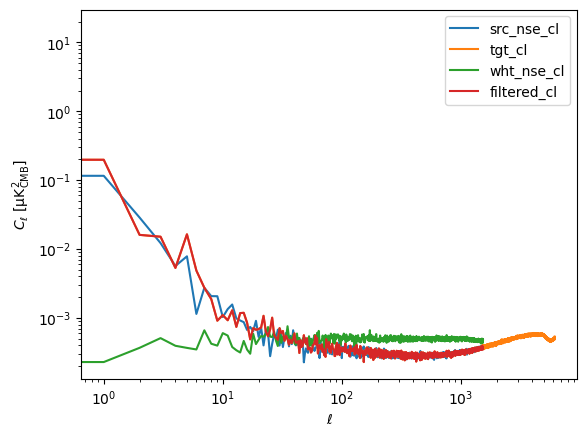

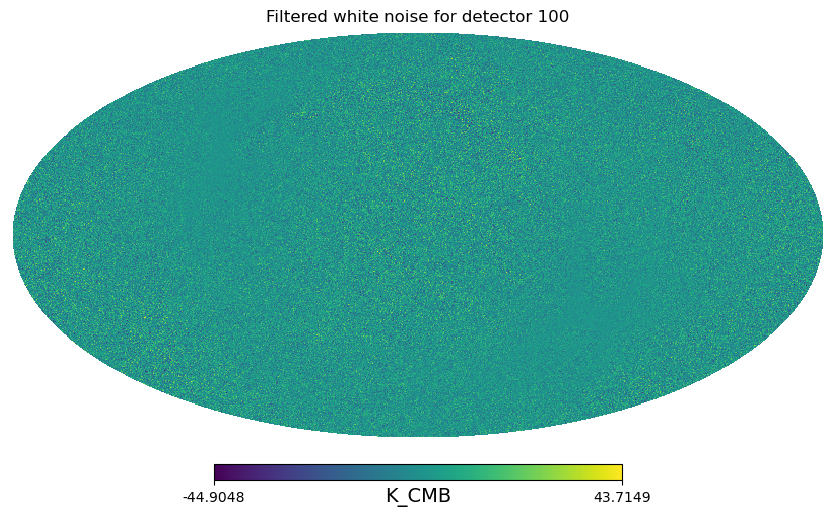

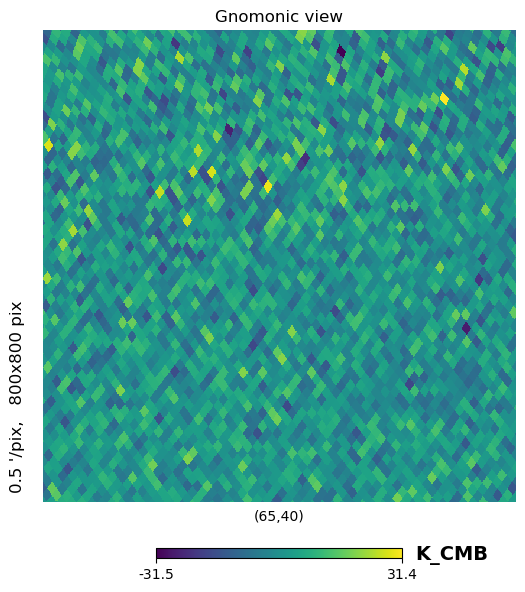

In [126]:
test_filter_noise_map(detector=100)